# Exploratory Data Analysis

In [24]:
# DS18 ML Essentials project
# Module 2: Exploratory Data Analysis

# Submitted by: Tzvi Eliezer Nir
# mail: tzvienir@gmail.com
# First submission: 17/03/2025


## IMPORTANT MESSAGE FOR THE READER

This notebook is long due to automatically generated plots.
**It is highly recommended to use the [markdown version](markdown/02_exploratory_data_analysis.md)** instead of the GitHub preview, as the latter can show partial notebook.

## In this notebook

In this notebook we will do an Exploratory Data Analysis for the Spotify dataset. Using the Flat File from previous chapter we will explore the data to better understand its structure, quality and patterns before moving on to modeling.

We will start with the Data Protocol, move on to creating data-relations reports automatically using AutoViz, and finish with applying descriptive statistics tools such as Skewness, ANOVA, correlations etc. to learn more about the data and its internal relations.

The analysis will be done for the target value, dummy columns, categorical columns and continuous columns. Each type of data with its own unique analysis tools.


 

## Data Protocol

The Data Protocol is used for project documentation and knowledge-preservation. It can be used like a pocket guide to the dataset description.

First lets import the data from the previous notebook:

In [25]:
import pandas as pd

df = pd.read_pickle("./pickle/01_data_preparation/data_preparation.pkl")

Now lets create the Data Protocol by printing the dataset characteristics into `.xlsx` files.

Notice that since the dataset includes also `object` columns, when getting the `min` and `max` properties I use a clone dataset containing only numerical data:

In [26]:
data_protocol_files_path = "./data/02_exploratory_data_analysis/data_protocol"

#Type of data 
df.dtypes.to_excel (f"{data_protocol_files_path}/df_datatype.xlsx", sheet_name='data_types')

#Isnull values 
df.isnull().to_excel(f"{data_protocol_files_path}/df_isnull.xlsx", sheet_name='isnull')

#unique values 
df.nunique().to_excel(f"{data_protocol_files_path}/df_nunique.xlsx", sheet_name='nunique')

# Select only numerical columns (int, float, and optionally bool)
df_numeric_copy = df.select_dtypes(include=["number"]).copy()

#Maximum points 
df_numeric_copy.max().to_excel(f"{data_protocol_files_path}/df_max.xlsx", sheet_name='max')

#Minimum points 
df_numeric_copy.min().to_excel(f"{data_protocol_files_path}/df_min.xlsx", sheet_name='min')
        

## Automated Reports

Using the `autoviz` package we can generate tabular and visual reports automatically:

Shape of your Data Set loaded: (28356, 25)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  9
    Number of Integer-Categorical Columns =  4
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  7
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  3
    Number of Date Time Columns =  0
    Number of ID Columns =  2
    Number of Columns to Delete =  0
    25 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Unnamed: 0', 'track_id']
To fix these data quality issues in the 

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Unnamed: 0,int64,0.000000,100,0.000000,28355.000000,Possible ID column: drop before modeling step.
track_id,object,0.000000,100,,,Possible ID column: drop before modeling step.
track_artist,object,0.014106,37,,,"4 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"
track_popularity,int64,0.000000,0,0.000000,100.000000,No issue
track_album_id,object,0.000000,79,,,No issue
track_album_release_date,object,0.000000,15,,,No issue
danceability,float64,0.000000,NA,0.000000,0.983000,Column has 257 outliers greater than upper bound (1.06) or lower than lower bound(0.26). Cap them or remove them.
energy,float64,0.000000,NA,0.000175,1.000000,Column has 222 outliers greater than upper bound (1.24) or lower than lower bound(0.18). Cap them or remove them.
key,int64,0.000000,0,0.000000,11.000000,No issue
loudness,float64,0.000000,NA,-46.448000,1.275000,Column has 837 outliers greater than upper bound (0.69) or lower than lower bound(-13.71). Cap them or remove them.


Number of All Scatter Plots = 45


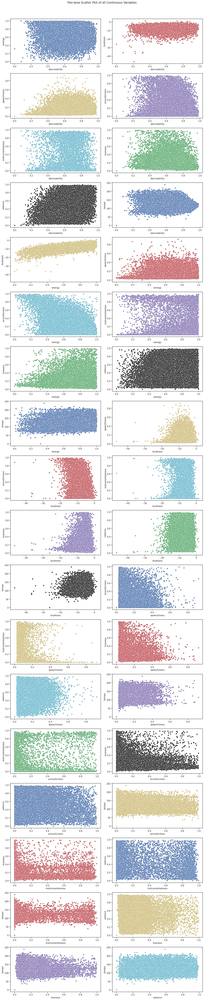

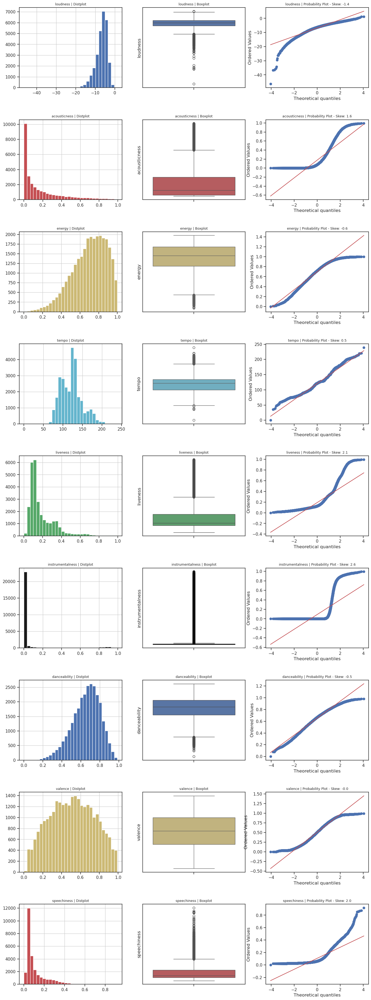

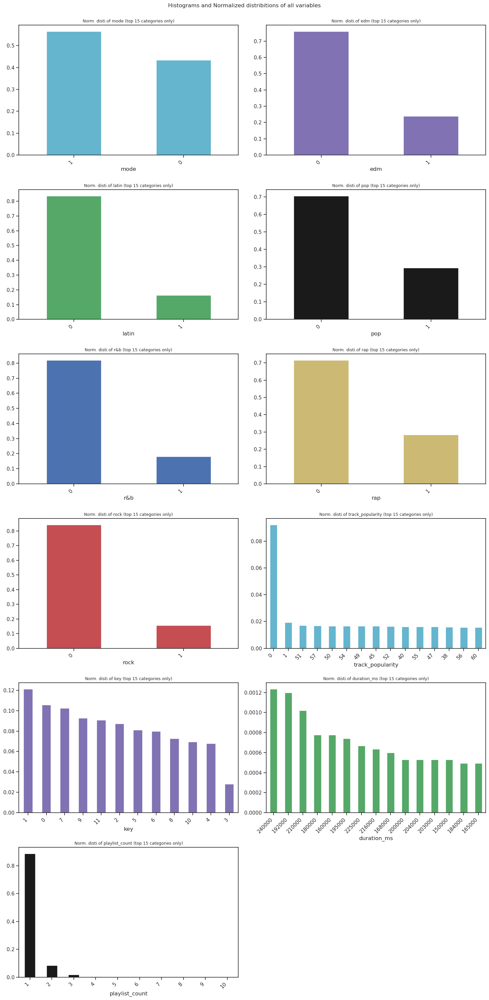

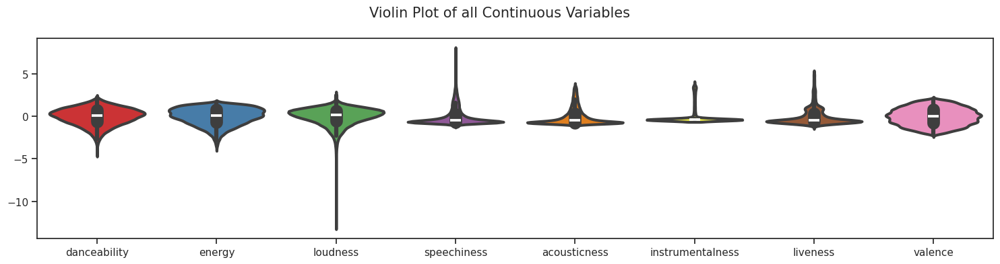

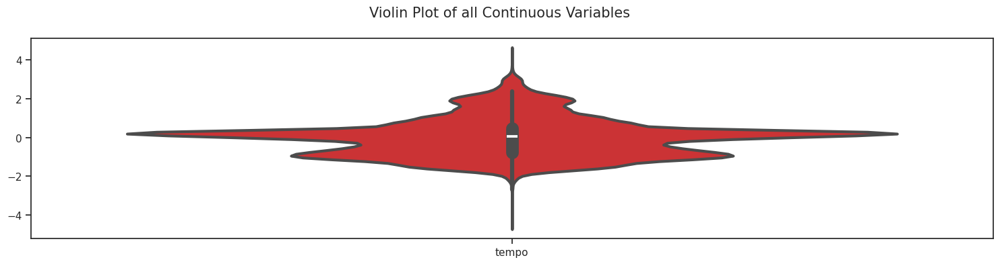

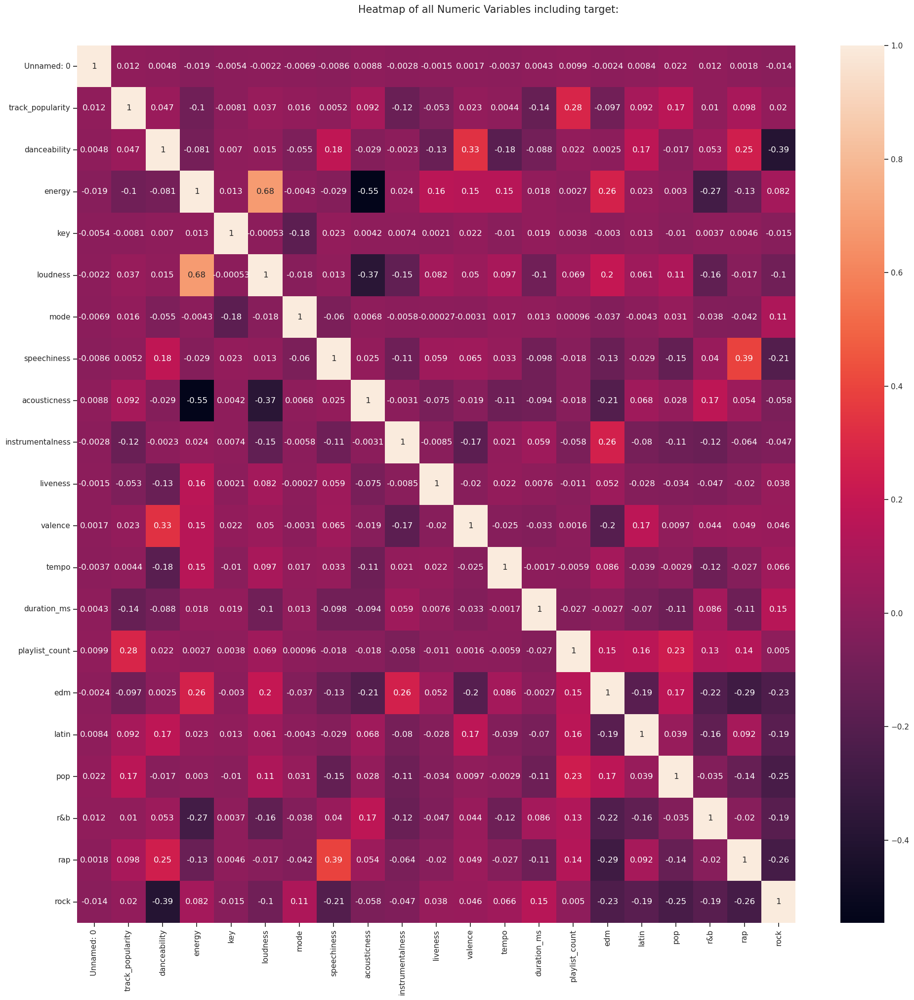

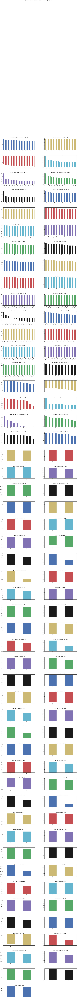

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /home/heaphopper/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /home/heaphopper/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /home/heaphopper/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /home/heaphopper/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /home/heaphopper/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /home/heaphopper/nltk_data...
[nltk_data]    |   Package movie_

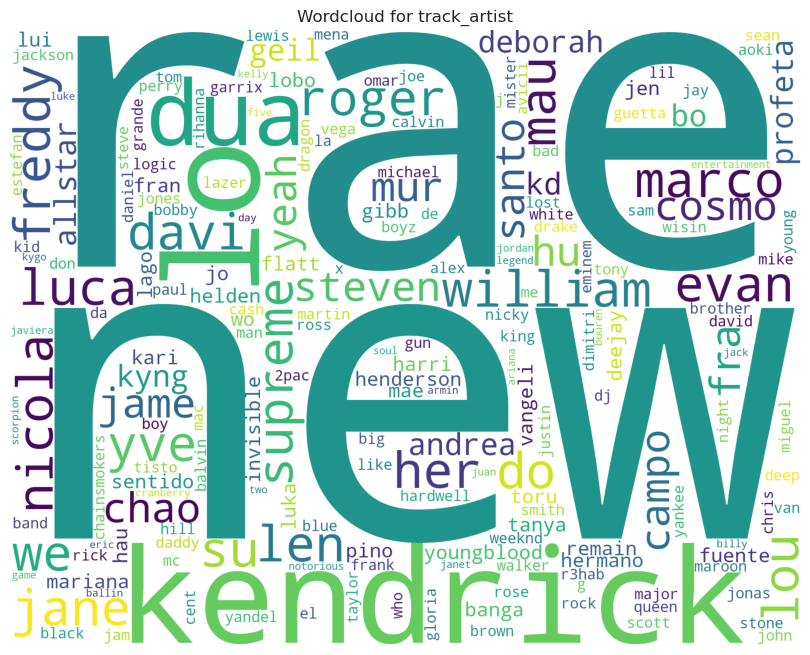

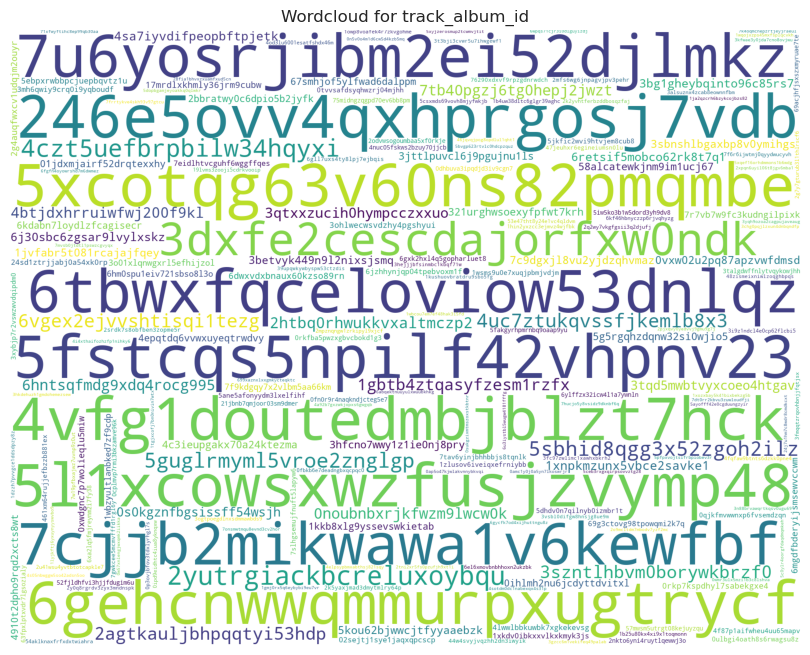

Could not draw wordcloud plot for track_album_release_date. We need at least 1 word to plot a word cloud, got 0.
All Plots done
Time to run AutoViz = 30 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,Unnamed: 0,track_id,track_artist,track_popularity,track_album_id,track_album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,playlist_count,edm,latin,pop,r&b,rap,rock
0,0,0017A6SJgTbfQVU2EtsPNo,Barbie's Cradle,41,1srJQ0njEQgd8w4XSqI4JQ,2001-01-01,0.682,0.401,2,-10.068,1,0.0236,0.279000,0.011700,0.0887,0.566,97.091,235440,1,0,0,0,0,0,1
1,1,002xjHwzEx66OWFV2IP9dk,RIKA,15,1ficfUnZMaY1QkNp15Slzm,2018-01-26,0.582,0.704,5,-6.242,1,0.0347,0.065100,0.000000,0.2120,0.698,150.863,197286,1,0,0,0,1,0,0
2,2,004s3t0ONYlzxII9PLgU6z,Steady Rollin,28,3z04Lb9Dsilqw68SHt6jLB,2017-11-21,0.303,0.880,9,-4.739,1,0.0442,0.011700,0.009940,0.3470,0.404,135.225,373512,1,0,0,0,0,0,1
3,3,008MceT31RotUANsKuzy3L,The.madpix.project,24,1Z4ANBVuhTlS6DprlP0m1q,2015-08-07,0.659,0.794,10,-5.644,0,0.0540,0.000761,0.132000,0.3220,0.852,128.041,228565,1,1,0,1,0,0,0
4,4,008rk8F6ZxspZT4bUlkIQG,YOSA & TAAR,38,2BuYm9UcKvI0ydXs5JKwt0,2018-11-16,0.662,0.838,1,-6.300,1,0.0499,0.114000,0.000697,0.0881,0.496,129.884,236308,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28351,28351,7zxRMhXxJMQCeDDg0rKAVo,NAV,72,4JR29CNW14Zc4Z5vflxkoJ,2017-02-24,0.744,0.715,0,-6.103,1,0.3510,0.101000,0.000000,0.0919,0.340,154.962,179773,1,0,0,0,1,0,0
28352,28352,7zyLObYw4QUKQDyZOb4J0Y,Father MC,36,14HYMxFhpgDIr9cci1u0kt,2010-10-01,0.832,0.666,1,-4.920,0,0.0633,0.143000,0.000000,0.0720,0.810,109.536,223890,1,0,0,0,1,0,0
28353,28353,7zycSpvjDcqh6YT1FEl2kY,Nicki Minaj,49,5qs8T6ZHSrnllnOuUk6muC,2014-12-15,0.963,0.603,2,-6.224,1,0.1800,0.067300,0.000006,0.2140,0.647,129.990,260240,1,1,0,1,0,0,0
28354,28354,7zye9v6B785eFWEFYs13C2,Ponderosa Twins Plus One,40,1xdgLmTFMSyJyI5DJOOX7T,2013-07-09,0.458,0.540,5,-6.457,0,0.0270,0.715000,0.000428,0.1150,0.657,142.218,191205,1,0,0,0,1,0,0


In [27]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV = AutoViz_Class()
AV.AutoViz('data/01_data_preparation/data_preparation.csv')

## Descriptive Statistics

We will use statistical tools to better understand and explore the data. We will use descriptive tools for the following four cases:

1. Exploring the **target value**
2. Exploring **dummy** columns
3. Exploring **category** columns
4. Exploring **continuous** columns

Each of the four types of data requires their own type of tools and statistical tests, as we will see shortly.

Later in this section, we will look for **correlations** in the dataset.

### Target Value

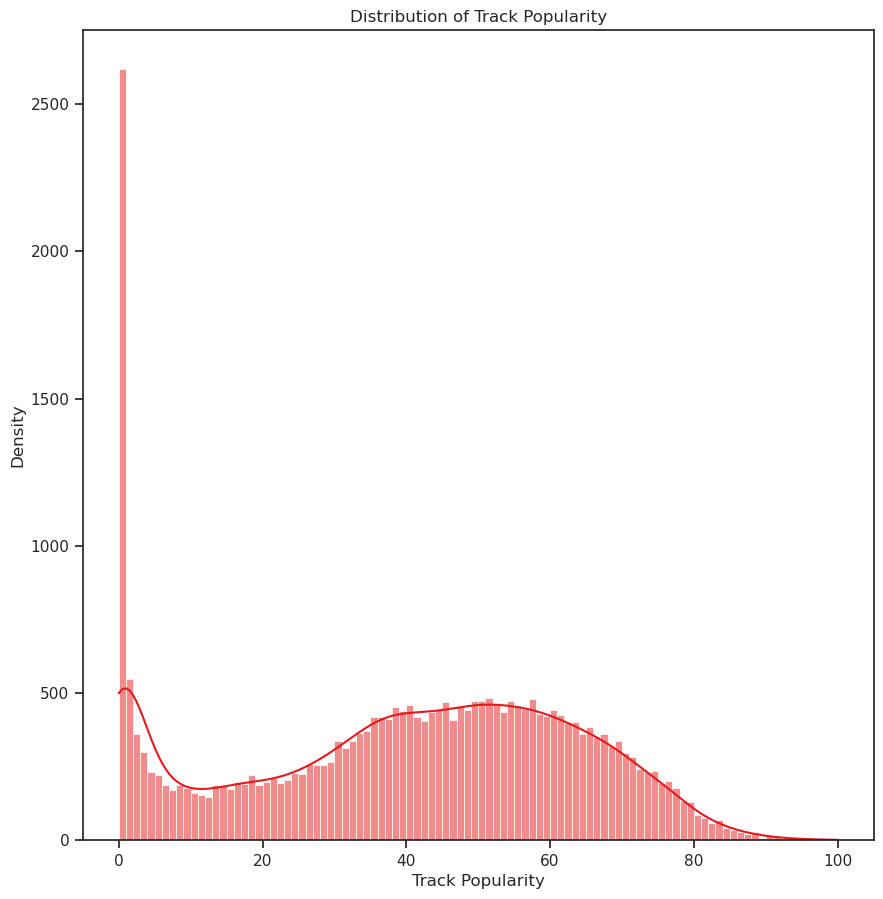

In [28]:
import seaborn as sns

import matplotlib.pyplot as plt

sns.histplot(df['track_popularity'], kde=True, bins=100)
plt.title('Distribution of Track Popularity')
plt.xlabel('Track Popularity')
plt.ylabel('Density')
plt.show()

Notice the high number of 0 popularity tracks. Spoiler alert: this data is valid, from recent years - and was not considered as an outlier when looking for outliers.

For now lets keep using the statistical tools, starting with skewness:

In [29]:
skewness = df['track_popularity'].skew()
print(f"Skewness of track_popularity: {skewness}")

Skewness of track_popularity: -0.23134997680726382


It seems that we can treat the target value column as parametric distributed!

### Dummy columns

In [30]:
df_dummy = df[['mode','edm','latin','pop','r&b','rap','rock']]
df_dummy

,mode,edm,latin,pop,r&b,rap,rock
0,1,0,0,0,0,0,1
1,1,0,0,0,1,0,0
2,1,0,0,0,0,0,1
3,0,1,0,1,0,0,0
4,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...
28351,1,0,0,0,1,0,0
28352,0,0,0,0,1,0,0
28353,1,1,0,1,0,0,0
28354,0,0,0,0,1,0,0


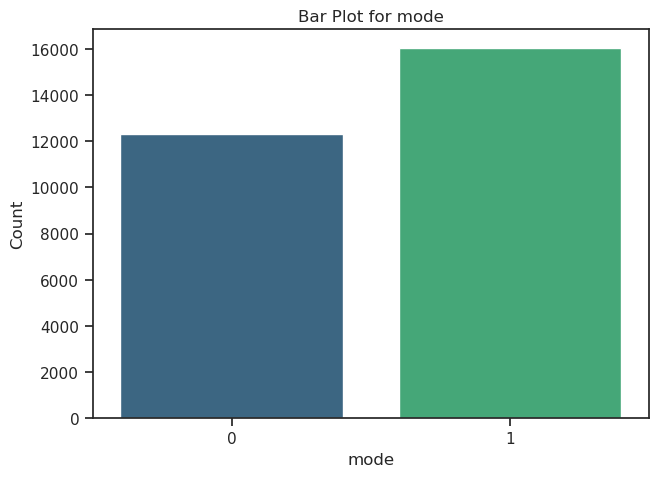

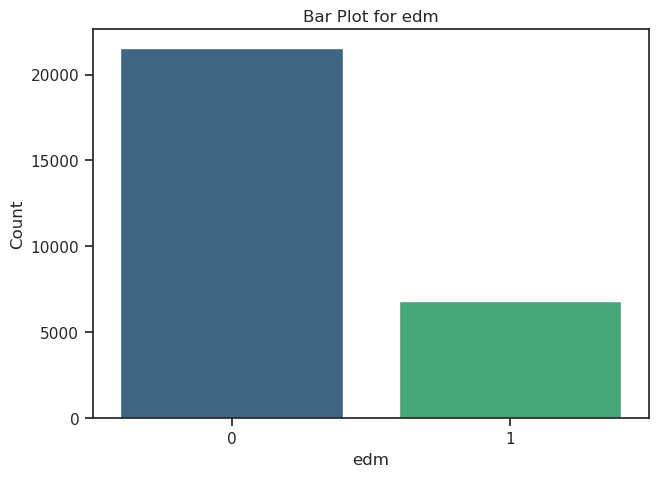

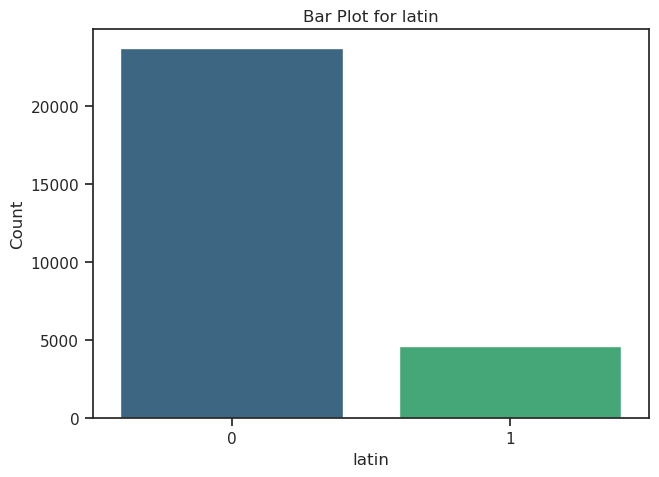

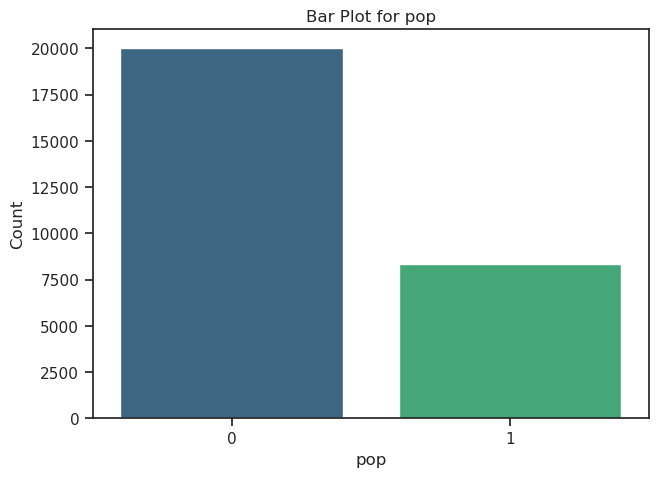

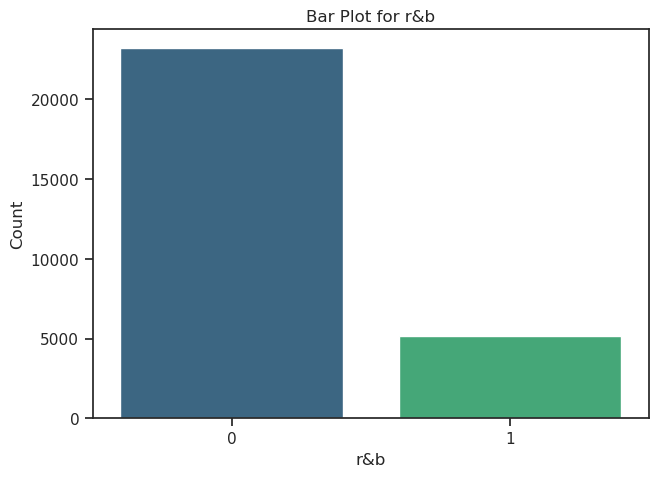

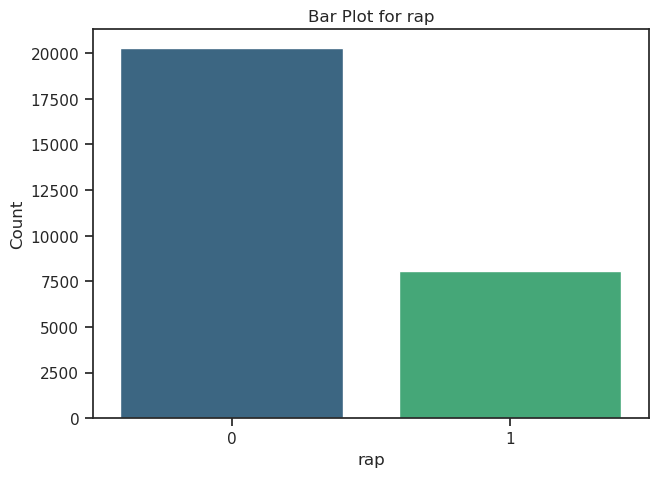

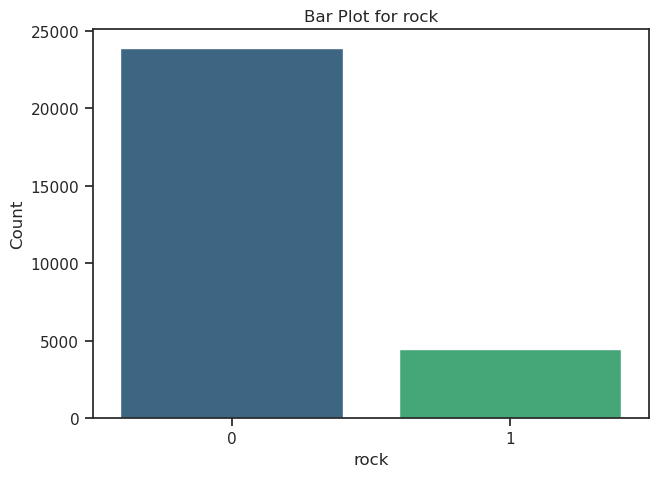

In [31]:
for column in df_dummy.columns:
    sns.countplot(x=column, data=df_dummy, palette="viridis")
    plt.title(f'Bar Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.show()

Im also trying to look for a correlation that might tell us of some dependency between the genres, but as the heatmap below shows - not even a single positive correlation can be found, and negative correlation are not very meaningful in the context of genre correlation.

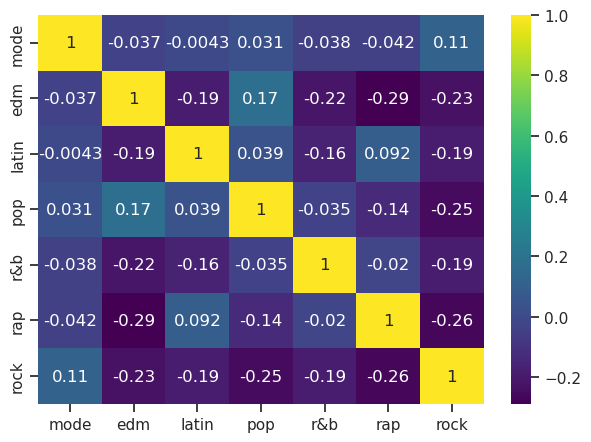

In [32]:
sns.heatmap(df_dummy.corr(), annot=True, cmap='viridis')
plt.show()

### Categorical columns

Apparently there is only one (non-dummy) categorical column - `key`:

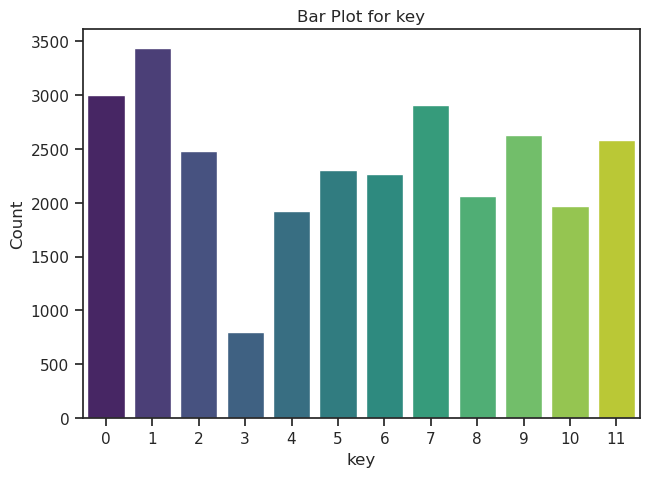

In [33]:
df_cat = df[['key']]

sns.countplot(x='key', data=df_cat, palette="viridis")
plt.title(f'Bar Plot for key')
plt.xlabel('key')
plt.ylabel('Count')
plt.show()

### Continues (numeric) column

With continuous data we have many statistical tools we can use. especially if the data is parametric - and fortunately there are parametric distributed features in our data..

In [34]:
df_num=df._get_numeric_data().dropna()
df_num = df_num.drop(columns=['key','mode','edm','latin','pop','r&b','rap','rock'])

df_num.shape

(28356, 12)

In [35]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28356 entries, 0 to 28355
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_popularity  28356 non-null  int64  
 1   danceability      28356 non-null  float64
 2   energy            28356 non-null  float64
 3   loudness          28356 non-null  float64
 4   speechiness       28356 non-null  float64
 5   acousticness      28356 non-null  float64
 6   instrumentalness  28356 non-null  float64
 7   liveness          28356 non-null  float64
 8   valence           28356 non-null  float64
 9   tempo             28356 non-null  float64
 10  duration_ms       28356 non-null  int64  
 11  playlist_count    28356 non-null  int64  
dtypes: float64(9), int64(3)
memory usage: 2.6 MB


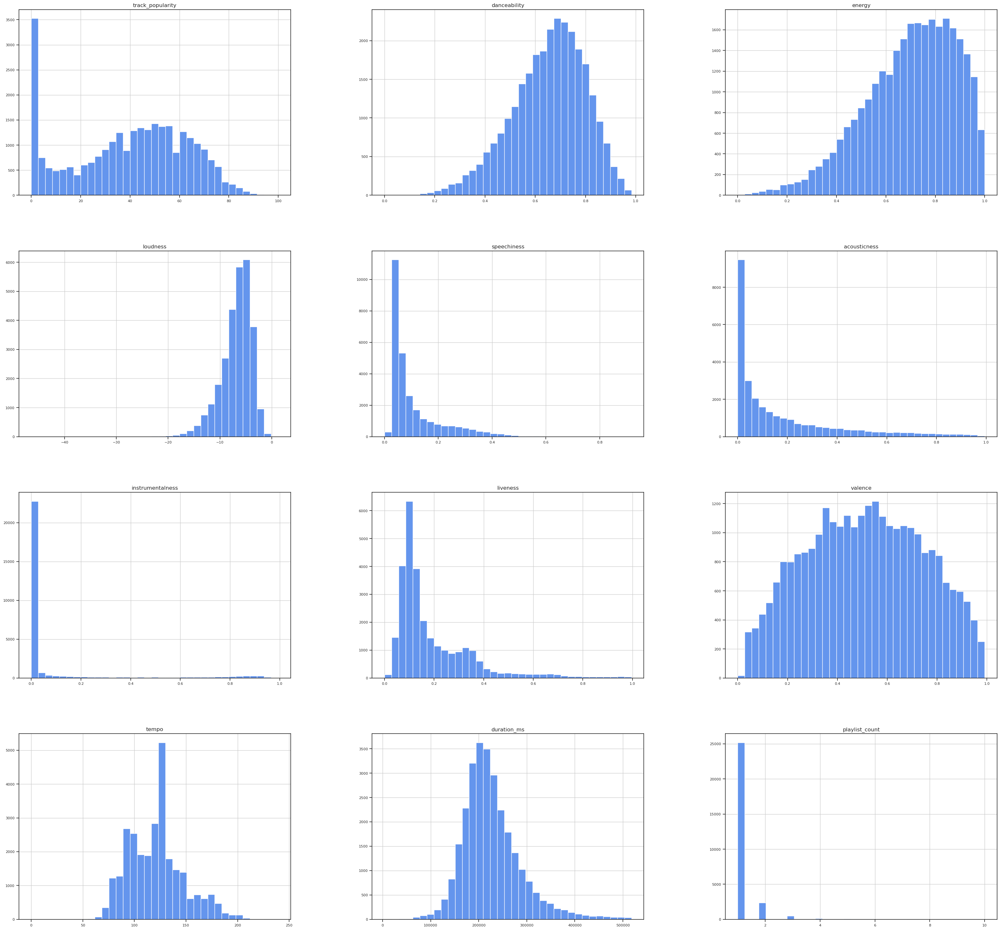

In [36]:
df_num.hist(figsize=(35, 35), bins=35, xlabelsize=8, ylabelsize=8, color = "cornflowerblue")
plt.show()

#### Skewness

Skewness is a statistical metric used to assess the asymmetry of the distribution of values in a dataset column. It helps determine whether the data can be considered parametric.

Values between -1 and 1 are generally considered to indicate a parametric distribution, while values outside this range suggest a non-parametric distribution.

In [37]:
def highlight(cell_value):
    highlight = 'background-color: mediumspringgreen;'
    default = ''
    negative = 'background-color: hotpink;'
    if cell_value > 1:
        return highlight
    elif cell_value < -1:
        return negative
    #else
       # return default  
pd.DataFrame(df_num.skew(),columns=['skewness']).sort_values(by='skewness', ascending=False).style.applymap(highlight)

,skewness
playlist_count,5.481869
instrumentalness,2.624985
liveness,2.081481
speechiness,1.964975
acousticness,1.576720
duration_ms,1.115164
tempo,0.513949
valence,-0.007334
track_popularity,-0.231350
danceability,-0.505789


### Correlations

Correlations can tell us about relationship in the dataset, however correlation do not imply causation! still it provides valuable insights. 

Lets start with the Pearson correlation for linear relationship:

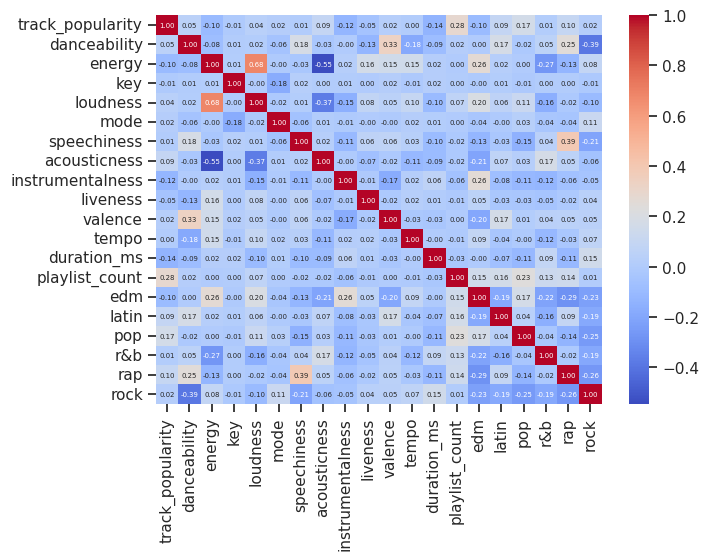

In [38]:
df2 = df._get_numeric_data().dropna()
sns.heatmap(df2.corr(), annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 5})
plt.show()

Using the Spearman correlation gave us about the same results:

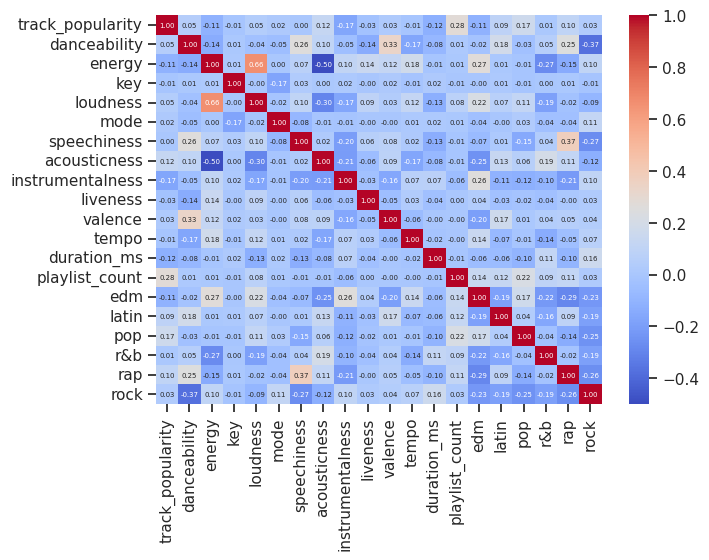

In [39]:
sns.heatmap(df2.corr(method='spearman'), annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 5})
plt.show()

### ANOVA

Our data have a textbook use-case for the ANOVA statistical tool. 
The genres are separate groups each with its own `track_popularity` distribution. Due to the large sample size and the fact that popularity distribution was already found to be parametric, we can use ANOVA to analyze the variance in popularity for each of the six main genres!

In [40]:
import scipy.stats as stats
import seaborn as sns
import numpy as np

In [41]:
pop_track_popularity = df[df['pop'] == 1]['track_popularity']
rap_track_popularity = df[df['rap'] == 1]['track_popularity']
rock_track_popularity = df[df['rock'] == 1]['track_popularity']
edm_track_popularity = df[df['edm'] == 1]['track_popularity']
latin_track_popularity = df[df['latin'] == 1]['track_popularity']
rnb_track_popularity = df[df['r&b'] == 1]['track_popularity']

# performe ANOVA
f_statistic, p_value = stats.f_oneway(  pop_track_popularity, 
                                        rap_track_popularity,
                                        rock_track_popularity,
                                        edm_track_popularity,
                                        latin_track_popularity,
                                        rnb_track_popularity)

print(f"F-statistic: {f_statistic}")
print(f"p-value: {p_value}")

if p_value < 0.05:
    print("There is a significant difference between the group means")
else:
    print("No significant difference between the group means")

F-statistic: 157.26337523426938
p-value: 5.993999686772797e-166
There is a significant difference between the group means


The high F-statistics and tiny P-value - both indicates that at least one group mean is significantly different from the others.

Lets visualize it!

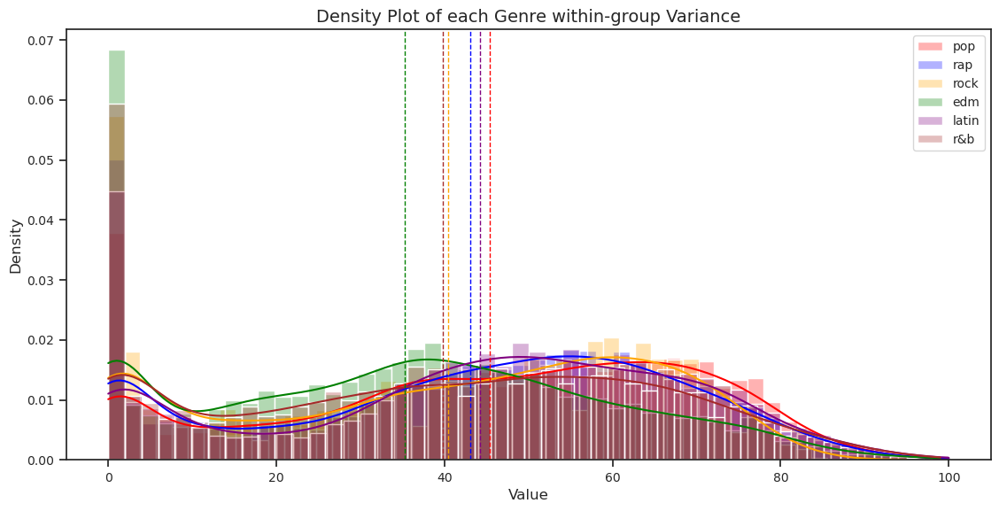

In [42]:
# Create a density plot
plt.figure(figsize=(12, 6))

# Plot the density of each group
sns.histplot(pop_track_popularity, kde=True, label='pop', color='red', bins=50, stat="density", alpha=0.3)
sns.histplot(rap_track_popularity, kde=True, label='rap', color='blue', bins=50, stat="density", alpha=0.3)
sns.histplot(rock_track_popularity, kde=True, label='rock', color='orange', bins=50, stat="density", alpha=0.3)
sns.histplot(edm_track_popularity, kde=True, label='edm', color='green', bins=50, stat="density", alpha=0.3)
sns.histplot(latin_track_popularity, kde=True, label='latin', color='purple', bins=50, stat="density", alpha=0.3)
sns.histplot(rnb_track_popularity, kde=True, label='r&b', color='brown', bins=50, stat="density", alpha=0.3)

# Add lines for the means of each group
plt.axvline(np.mean(pop_track_popularity), color='red', linestyle='--', linewidth=1)
plt.axvline(np.mean(rap_track_popularity), color='blue', linestyle='--', linewidth=1)
plt.axvline(np.mean(rock_track_popularity), color='orange', linestyle='--', linewidth=1)
plt.axvline(np.mean(edm_track_popularity), color='green', linestyle='--', linewidth=1)
plt.axvline(np.mean(latin_track_popularity), color='purple', linestyle='--', linewidth=1)
plt.axvline(np.mean(rnb_track_popularity), color='brown', linestyle='--', linewidth=1)

# Set titles and labels with smaller font size
plt.title('Density Plot of each Genre within-group Variance', fontsize=14)
plt.xlabel('Value', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend(fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(False)

# Show the plot
plt.show()

### Addressing the zero-popularity tracks

Having a so many tracks with zero popularity is alarming. I just want to make sure that this data is valid. For example, if all `0` values are old songs - maybe the popularity was not measured yet. So i decided to plot the distribution of zero popularity songs over the years:

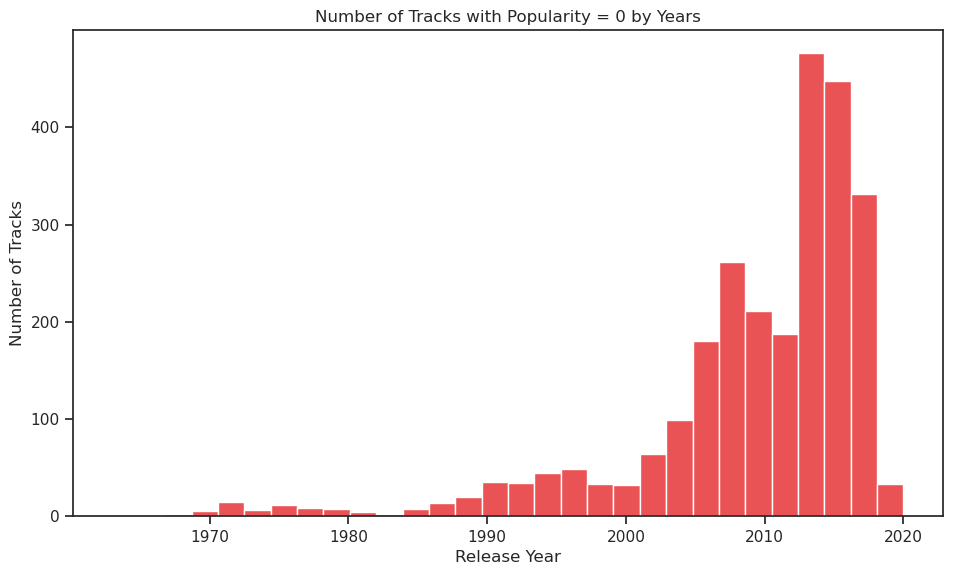

In [43]:
# Create a new instance to store the years
release_years = df['track_album_release_date'].dt.year

# Filter tracks with popularity equal to 0
df_popularity_zero = df[df['track_popularity'] == 0]

# Create a histogram of the number of tracks with popularity = 0 by years
plt.figure(figsize=(10, 6))
sns.histplot(release_years[df['track_popularity'] == 0], bins=30, kde=False)
plt.title('Number of Tracks with Popularity = 0 by Years')
plt.xlabel('Release Year')
plt.ylabel('Number of Tracks')
plt.show()

It seems that the zero popularity is actually a late years trend, this makes me more comfortable working with this data. 

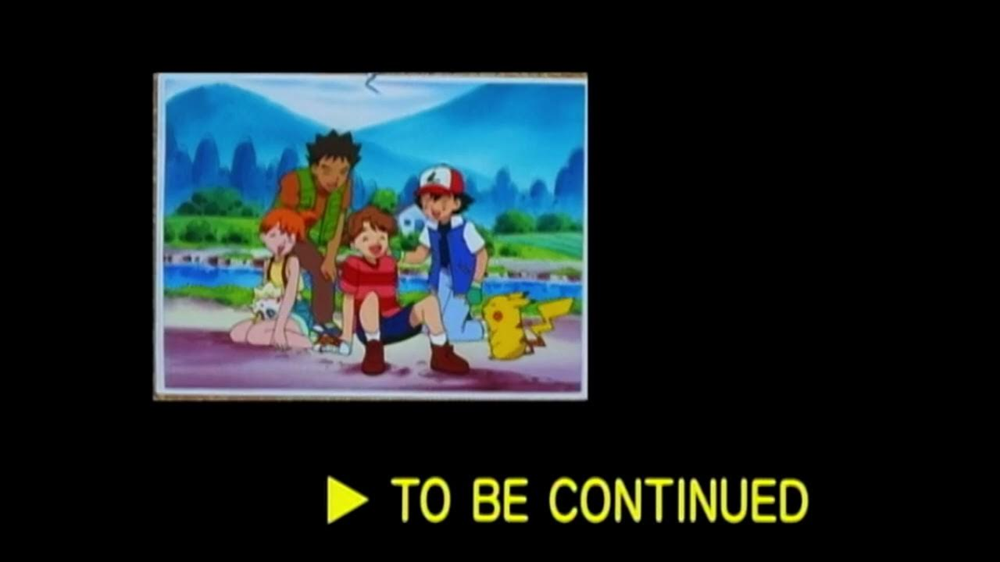